In [7]:
import numpy as np  # 科学计算工具包
import pandas as pd  # 数据分析工具包
import matplotlib.pyplot as plt # 图表绘制工具包
import seaborn as sns # 基于 matplot, 导入 seaborn 会修改默认的 matplotlib 配色方案和绘图样式，这会提高图表的可读性和美观性
import os
from scipy import stats
from scipy.stats import norm, skew 

plt.rc("font",family="SimHei",size="15")  #解决中文乱码问题

# 在 jupyter notebook 里面显示图表
%matplotlib inline 

In [33]:
df_train = pd.read_csv("../data/house-prices-advanced-regression-techniques/train.csv")
df_test = pd.read_csv('../data/house-prices-advanced-regression-techniques/test.csv')

df_train.head()



,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,...,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,1,60,RL,65.0,8450,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,2,2008,WD,Normal,208500
1,2,20,RL,80.0,9600,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,5,2007,WD,Normal,181500
2,3,60,RL,68.0,11250,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,9,2008,WD,Normal,223500
3,4,70,RL,60.0,9550,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,2,2006,WD,Abnorml,140000
4,5,60,RL,84.0,14260,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,12,2008,WD,Normal,250000


In [34]:
df_train['SalePrice'].describe()

count      1460.000000
mean     180921.195890
std       79442.502883
min       34900.000000
25%      129975.000000
50%      163000.000000
75%      214000.000000
max      755000.000000
Name: SalePrice, dtype: float64

In [35]:


print(df_train.shape) #查看train的形狀，以方便後來訂定神經網路的輸入層
print(df_test.shape)  #查看test形狀
print('*'*50)
print(df_train.dtypes) #看一下訓練資料的各個欄位的型態



(1460, 81)
(1459, 80)
**************************************************
Id                 int64
MSSubClass         int64
MSZoning          object
LotFrontage      float64
LotArea            int64
Street            object
Alley             object
LotShape          object
LandContour       object
Utilities         object
LotConfig         object
LandSlope         object
Neighborhood      object
Condition1        object
Condition2        object
BldgType          object
HouseStyle        object
OverallQual        int64
OverallCond        int64
YearBuilt          int64
YearRemodAdd       int64
RoofStyle         object
RoofMatl          object
Exterior1st       object
Exterior2nd       object
MasVnrType        object
MasVnrArea       float64
ExterQual         object
ExterCond         object
Foundation        object
BsmtQual          object
BsmtCond          object
BsmtExposure      object
BsmtFinType1      object
BsmtFinSF1         int64
BsmtFinType2      object
BsmtFinSF2         int64
Bs

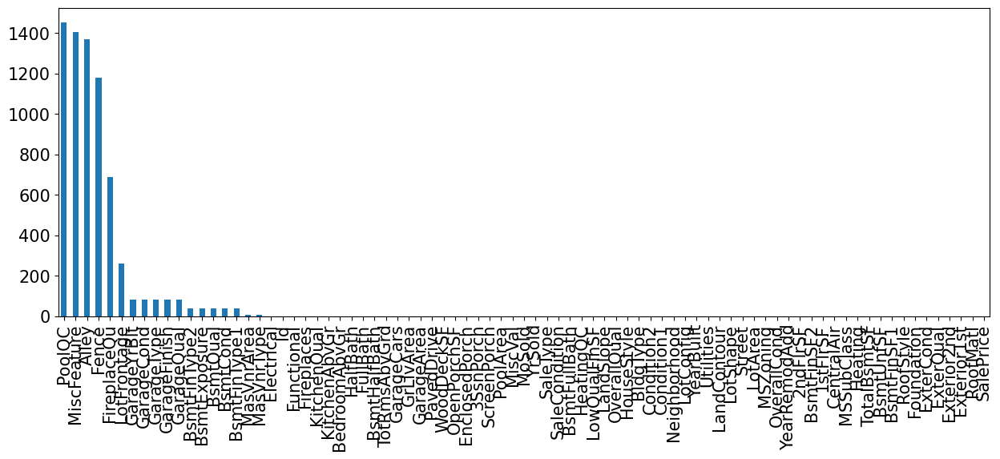

In [ ]:
import matplotlib.pyplot as plt
import missingno as msno
 
missing = df_train.isnull().sum()
issing = missing[missing &amp;amp;gt; 0]
missing.sort_values(inplace=True,ascending = False)
plt.subplots(figsize=(15,5))
 # 設定畫面大小missing.plot.bar()
plt.show()

In [11]:
trian_corr =df_train.corr() #計算相關係數，如果是物件(object)的話，.corr()會無法計算，所以只會出現型態是float的行！
float_data = trian_corr.index #是float或int的傢伙
all_col = df_train.columns #全部的col
object_data = []
for i in range(len(all_col)): #查找全部的all_col，len(all_col)是長度(要全部找過一遍)
    if all_col[i] not in float_data: #如果在float_data裡面沒有，表示它是object
        object_data.append(all_col[i]) #不是就加上去
print(len(object_data))
print(object_data)

43
['MSZoning', 'Street', 'Alley', 'LotShape', 'LandContour', 'Utilities', 'LotConfig', 'LandSlope', 'Neighborhood', 'Condition1', 'Condition2', 'BldgType', 'HouseStyle', 'RoofStyle', 'RoofMatl', 'Exterior1st', 'Exterior2nd', 'MasVnrType', 'ExterQual', 'ExterCond', 'Foundation', 'BsmtQual', 'BsmtCond', 'BsmtExposure', 'BsmtFinType1', 'BsmtFinType2', 'Heating', 'HeatingQC', 'CentralAir', 'Electrical', 'KitchenQual', 'Functional', 'FireplaceQu', 'GarageType', 'GarageFinish', 'GarageQual', 'GarageCond', 'PavedDrive', 'PoolQC', 'Fence', 'MiscFeature', 'SaleType', 'SaleCondition']


In [12]:
from sklearn.preprocessing import LabelEncoder
#df_train[pd.isnull(df_train)]  = 'NaN'
for i in object_data: #將轉換是object的傢伙轉換，從object_data陣列一個一個抓出來改
        df_train[i] = LabelEncoder().fit_transform(df_train[i].factorize()[0]) 
        #pd.factorize()[0]會給nans(缺失值)一個-1的值，若沒寫這個，會造成等號兩邊不等的情況

df_train

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,...,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,1,60,0,65.0,8450,0,0,0,0,0,...,0,0,0,0,0,2,2008,0,0,208500
1,2,20,0,80.0,9600,0,0,0,0,0,...,0,0,0,0,0,5,2007,0,0,181500
2,3,60,0,68.0,11250,0,0,1,0,0,...,0,0,0,0,0,9,2008,0,0,223500
3,4,70,0,60.0,9550,0,0,1,0,0,...,0,0,0,0,0,2,2006,0,1,140000
4,5,60,0,84.0,14260,0,0,1,0,0,...,0,0,0,0,0,12,2008,0,0,250000
5,6,50,0,85.0,14115,0,0,1,0,0,...,0,0,1,1,700,10,2009,0,0,143000
6,7,20,0,75.0,10084,0,0,0,0,0,...,0,0,0,0,0,8,2007,0,0,307000
7,8,60,0,NaN,10382,0,0,1,0,0,...,0,0,0,1,350,11,2009,0,0,200000
8,9,50,1,51.0,6120,0,0,0,0,0,...,0,0,0,0,0,4,2008,0,1,129900
9,10,190,0,50.0,7420,0,0,0,0,0,...,0,0,0,0,0,1,2008,0,0,118000


In [13]:
import warnings
warnings.filterwarnings('ignore')

import seaborn as sns
trian_corr =df_train.corr() #計算相關係數
print(trian_corr.shape) #查看形狀
plt.subplots(figsize=(300, 100))  # 設置長寬尺寸大小
sns.heatmap(trian_corr, annot=True, vmax=1, cmap="Blues")



(81, 81)


findfont: Font family ['SimHei'] not found. Falling back to DejaVu Sans.


<AxesSubplot:>

In [14]:
high_corr = trian_corr.index[abs(trian_corr["SalePrice"])>0.6]
#abs是取絕對值的意思
#abs(trian_corr["SalePrice"])>0.6 這句的意思是與SalePrice有關的係數>0.6的判別式，它會輸出True(大於0.6)或是False
#abs(trian_corr["SalePrice"])>0.6 會丟回一堆True和False，放在原本的trian_corr.index[]就會把是大於0.6的傳回去
print(high_corr) 

Index(['OverallQual', 'TotalBsmtSF', '1stFlrSF', 'GrLivArea', 'GarageCars',
       'GarageArea', 'SalePrice'],
      dtype='object')


In [15]:
trian_corr[high_corr]

,OverallQual,TotalBsmtSF,1stFlrSF,GrLivArea,GarageCars,GarageArea,SalePrice
Id,-0.028365,-0.015415,0.010496,0.008273,0.016570,0.017634,-0.021917
MSSubClass,0.032628,-0.238518,-0.251758,0.074853,-0.040110,-0.098672,-0.084284
MSZoning,-0.015122,-0.175826,-0.227642,-0.061209,-0.077273,-0.057814,-0.116047
LotFrontage,0.251646,0.392075,0.457181,0.402797,0.285691,0.344997,0.351799
LotArea,0.105806,0.260833,0.299475,0.263116,0.154871,0.180403,0.263843
...,...,...,...,...,...,...,...
MoSold,0.070815,0.013196,0.031372,0.050240,0.040522,0.027974,0.046432
YrSold,-0.027347,-0.014969,-0.013604,-0.036526,-0.039117,-0.027378,-0.028923
SaleType,0.063406,0.082509,0.083203,0.033941,0.019239,0.037023,0.072896
SaleCondition,0.131870,0.142533,0.166194,0.092110,0.132221,0.127422,0.142503


In [16]:


for i in df_train.columns: #查找原本資料中所有columns
    if i not in high_corr: #如果沒有相關係數大於0.6的話
        df_train = df_train.drop(i,axis=1) #就把它拔掉
print(df_train)



      OverallQual  TotalBsmtSF  1stFlrSF  GrLivArea  GarageCars  GarageArea  \
0               7          856       856       1710           2         548   
1               6         1262      1262       1262           2         460   
2               7          920       920       1786           2         608   
3               7          756       961       1717           3         642   
4               8         1145      1145       2198           3         836   
...           ...          ...       ...        ...         ...         ...   
1455            6          953       953       1647           2         460   
1456            6         1542      2073       2073           2         500   
1457            7         1152      1188       2340           1         252   
1458            5         1078      1078       1078           1         240   
1459            5         1256      1256       1256           1         276   

      SalePrice  
0        208500  
1        181500

In [17]:


train_targets = df_train["SalePrice"].values #把SalePrice這行數值整個拉出來
train_data = df_train.drop(columns=["SalePrice"]) #刪除SalePrice這行
print(train_targets)
print("*"*50)
print(train_data)



[208500 181500 223500 ... 266500 142125 147500]
**************************************************
      OverallQual  TotalBsmtSF  1stFlrSF  GrLivArea  GarageCars  GarageArea
0               7          856       856       1710           2         548
1               6         1262      1262       1262           2         460
2               7          920       920       1786           2         608
3               7          756       961       1717           3         642
4               8         1145      1145       2198           3         836
...           ...          ...       ...        ...         ...         ...
1455            6          953       953       1647           2         460
1456            6         1542      2073       2073           2         500
1457            7         1152      1188       2340           1         252
1458            5         1078      1078       1078           1         240
1459            5         1256      1256       1256           1  

In [18]:


from sklearn.model_selection import train_test_split
X_train,X_validation,Y_trian,Y_validation = train_test_split(train_data, train_targets, test_size=0.2, random_state=0)
#X_train,X_test, y_train, y_test = model_selection.train_test_split(train_data,train_target,test_size=0.2, random_state=0)
#train_test_split的括號裡面，1.資料的x那些種類2.y的部分3.X_test的部分要佔全部資料的多少(我們這裡是驗證集唷)4.指定一個隨機種子，0的話就是隨機囉
#就是一種隨機切分資料的功能
#隨機種子相同的話，在另一個框框在跑一次一樣的code還是會出現相同的隨機數
print(X_train.shape)
print(Y_trian.shape)
print('*'*50)
print(X_validation.shape)
print(Y_validation.shape)
X_train_dataset = X_train.values #取出數值，轉換回list
X_validation_dataset = X_validation.values
print(X_train_dataset)



(1168, 6)
(1168,)
**************************************************
(292, 6)
(292,)
[[   9 1822 1828 1828    3  774]
 [   5  894  894  894    1  308]
 [   5  876  964  964    2  432]
 ...
 [   6    0 1318 1902    2  539]
 [   7 1374 1557 1557    2  420]
 [   7 1195 1195 1839    2  486]]


In [19]:
from sklearn import preprocessing #引入所需函式庫
normalize = preprocessing.StandardScaler() #取一個短的名字
# 標準化處理
X_trian_normal_data = normalize.fit_transform(X_train_dataset) #將訓練資料標準化
X_validation_normal_data = normalize.fit_transform(X_validation_dataset) #將驗證資料標準化

print(X_trian_normal_data)
print('*'*50)
print(X_validation_normal_data)

[[ 2.13150648  1.86572881  1.78757018  0.60188649  1.68363344  1.43474327]
 [-0.79485211 -0.38726187 -0.71540986 -1.21671763 -1.05711061 -0.79116606]
 [-0.79485211 -0.43096212 -0.52782035 -1.08041967  0.31326141 -0.19886401]
 ...
 [-0.06326246 -2.55770764  0.4208466   0.7459729   0.31326141  0.31223535]
 [ 0.66832719  0.77807813  1.06133079  0.0742187   0.31326141 -0.25618356]
 [ 0.66832719  0.34350342  0.09122504  0.62330474  0.31326141  0.05907398]]
**************************************************
[[-0.10448035  1.80908987  3.08966184  1.77891255  0.30770478  0.05915902]
 [-0.10448035 -0.50234569 -0.48512908  0.13380716 -0.92311434 -0.99987664]
 [-0.79784997 -0.68477796 -0.43691417 -0.52458613 -0.92311434 -0.51376191]
 ...
 [-0.10448035 -0.67537423  1.13581016  1.79822542 -0.92311434 -1.10404408]
 [-1.49121958 -1.22831325 -1.05911606 -1.39366529 -2.15393345 -2.04155105]
 [-0.79784997 -1.0214313  -1.35070145 -0.68611196 -0.92311434 -0.79154175]]


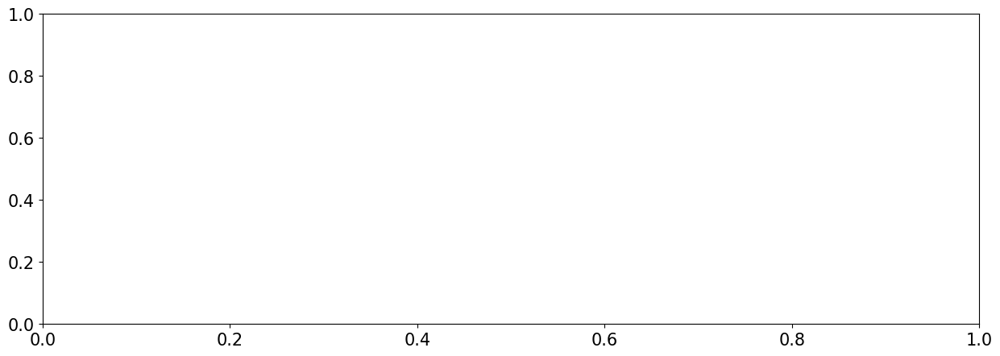

In [51]:
import matplotlib.pyplot as plt
import missingno as msno

missing = X_train.isnull().sum()
missing.sort_values(inplace=True,ascending = False)
plt.subplots(figsize=(15,5))
 # 設定畫面大小missing.plot.bar()
plt.show()

In [20]:

from keras.models import Sequential
from keras import layers
from keras import optimizers
from keras.layers import BatchNormalization,Dropout,Dense
from keras.callbacks import ModelCheckpoint
#上方為引進所需model

#建立model
def model():
    model = Sequential()
    model.add(layers.Dense(1024,kernel_initializer = 'random_normal',
             activation = 'relu',
             input_shape = (X_trian_normal_data.shape[1],)))
    model.add(Dropout(0.3))
    model.add(layers.Dense(1024, kernel_initializer = 'random_normal', 
                        activation = 'relu'))
    model.add(Dropout(0.3))
    model.add(layers.Dense(512, kernel_initializer = 'random_normal', 
                        activation = 'relu'))
    model.add(Dropout(0.3))
    model.add(layers.Dense(256, kernel_initializer = 'random_normal', 
                           activation = 'relu'))
    model.add(Dropout(0.3))
    model.add(layers.Dense(128, kernel_initializer = 'random_normal', 
                           activation = 'relu'))
    model.add(Dropout(0.3))
    model.add(layers.Dense(32, kernel_initializer = 'random_normal', 
                           activation = 'relu'))
    model.add(Dropout(0.3))
    model.add(layers.Dense(16, kernel_initializer = 'random_normal', 
                           activation = 'relu'))
    model.add(Dropout(0.3))
    model.add(layers.Dense(1, kernel_initializer = 'random_normal',
                          activation = 'linear'))
    adam = optimizers.Adam(lr=0.001) #lr學習率
    model.compile(optimizer = adam, loss = 'mae')#設定要的優化器以及loss函數
    return model     

In [21]:
call = ModelCheckpoint('good.h5',
                     monitor = 'val_loss',
                     verbose = 0,
                     save_best_only = True,
                     save_weights_only = True,
                     mode = 'auto',
                     period = 1)


model = model()    
history = model.fit(X_trian_normal_data, Y_trian,
                    validation_data = [X_validation_normal_data, Y_validation],
                    callbacks = [call],
                    epochs = 600, 
                    batch_size = 512, verbose = 1)

Epoch 1/600
3/3 [==============================] - 1s 183ms/step - loss: 180808.9219 - val_loss: 181370.3906
Epoch 2/600
3/3 [==============================] - 0s 150ms/step - loss: 180808.8750 - val_loss: 181370.2969
Epoch 3/600
3/3 [==============================] - 0s 148ms/step - loss: 180808.7344 - val_loss: 181369.8594
Epoch 4/600
3/3 [==============================] - 0s 143ms/step - loss: 180808.0000 - val_loss: 181368.0156
Epoch 5/600
3/3 [==============================] - 0s 148ms/step - loss: 180805.1094 - val_loss: 181360.8906
Epoch 6/600
3/3 [==============================] - 0s 197ms/step - loss: 180794.7969 - val_loss: 181336.6094
Epoch 7/600
3/3 [==============================] - 0s 156ms/step - loss: 180760.1562 - val_loss: 181261.7500
Epoch 8/600
3/3 [==============================] - 0s 150ms/step - loss: 180659.2344 - val_loss: 181047.8594
Epoch 9/600
3/3 [==============================] - 0s 173ms/step - loss: 180378.7969 - val_loss: 180480.7344
Epoch 10/600
3/3 [=

findfont: Font family ['SimHei'] not found. Falling back to DejaVu Sans.


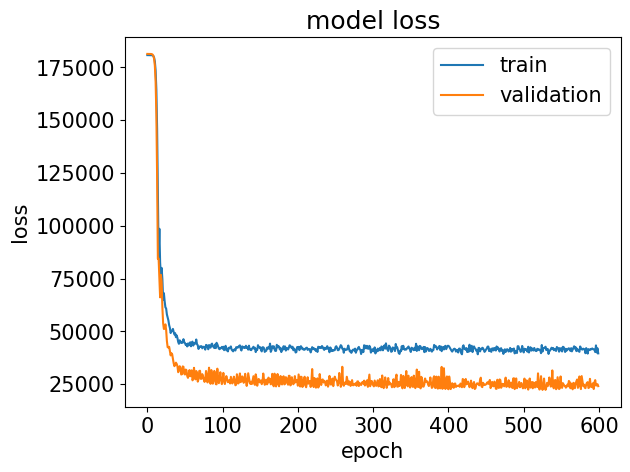

In [22]:


#history 會記錄訓練的狀況，會將model.fit回傳的東西記錄下來，以下是常用的示範
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'validation'], loc = 'upper right')
plt.show()



In [23]:


for i in df_test.columns: #查找原本資料中所有columns
    if i not in high_corr: 
        #如果沒有在訓練時相關係數大於0.6的話就拔掉，因為真正影響房價的不是小於0.6的
        df_test = df_test.drop(i,axis=1) 
        #i是跑過test裡面的columns所有人，axis=1是指定要丟掉"行"



In [24]:
import math

for i in range(df_test.shape[1]):
    total=0
    amount=0
    for j in range(df_test.shape[0]):    
        if  math.isnan(df_test.iloc[:,i][j]) != True:    
            total=total+df_test.iloc[:,i][j]
            amount=amount+1
    meann=total/amount
    print(meann)
  
    for j in range(df_test.shape[0]):
        if math.isnan(df_test.iloc[:,i][j]):
            df_test.iloc[:,i][j]=meann
       
            
pd.set_option('display.max_rows', None)
print(df_test)  

6.078821110349555
1046.1179698216736
1156.534612748458
1486.0459218642907
1.7661179698216736
472.76886145404666
      OverallQual  TotalBsmtSF  1stFlrSF  GrLivArea  GarageCars   GarageArea
0               5    882.00000       896        896    1.000000   730.000000
1               6   1329.00000      1329       1329    1.000000   312.000000
2               5    928.00000       928       1629    2.000000   482.000000
3               6    926.00000       926       1604    2.000000   470.000000
4               8   1280.00000      1280       1280    2.000000   506.000000
5               6    763.00000       763       1655    2.000000   440.000000
6               6   1168.00000      1187       1187    2.000000   420.000000
7               6    789.00000       789       1465    2.000000   393.000000
8               7   1300.00000      1341       1341    2.000000   506.000000
9               4    882.00000       882        882    2.000000   525.000000
10              7   1405.00000      1337 

In [27]:


X_test_dataset = df_test.values #只要數值就好不要dataframe形式
from sklearn import preprocessing
normalize = preprocessing.StandardScaler() 
# 標準化處理
X_test_normal_data = normalize.fit_transform(X_test_dataset)

print(X_test_normal_data) #看一下標準化的結果



[[-0.75110125 -0.37080849 -0.65456132 -1.21558782 -0.98801273  1.18594459]
 [-0.05487716  0.63914427  0.43329817 -0.32353941 -0.98801273 -0.7412126 ]
 [-0.75110125 -0.266876   -0.57416524  0.29450799  0.30162251  0.04255946]
 ...
 [-0.75110125  0.40190704  0.16949853 -0.539856    0.30162251  0.47593931]
 [-0.75110125 -0.30302643 -0.46864538 -1.06313613 -2.27764797 -2.17966486]
 [ 0.64134693 -0.11323665 -0.40332356  1.0588266   1.59125775  0.81711068]]


In [26]:


model.load_weights('good.h5') #召喚之前儲存的model
pred = model.predict(X_test_normal_data) #括號內填入要預測的資料
print(pred)



46/46 [==============================] - 0s 3ms/step
[[133033.06]
 [161711.73]
 [149892.8 ]
 ...
 [151464.42]
 [110023.2 ]
 [246604.77]]


In [ ]:


with open('house_predict.csv', 'w') as f: #開啟一個檔案，house_predict.csv是名字；w是寫入
    f.write('id,SalePrice\n') #寫入最上方的列，並用\n往下一列
    for i in range(len(pred)): #len(pred)看整個test有多長，然後用for去跑全部
        f.write(str(i + 1461) + ',' + str(float(pred[i])) + '\n')
        #寫入，這邊特別注意「+1461」，因為它給的sample_submission是從1461開始
        #中間加上逗號是因為前面有介紹過csv檔是以逗號為間隔的檔案
        #str(float(pred[i]):先把它變成浮點數，再用str()把它變回字串
        #後面的'\n'是要換下一列的意思
        #注意到中間全部是用「+號」隔開，這是字串的基本招式唷   

